In [8]:
import os
import pandas
import matplotlib.pyplot as plt
import seaborn
from tqdm.notebook import tqdm
import numpy as np

import torch
from torch import nn
from torch.optim import Adam
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import CelebA
from torchvision import transforms
import torchvision.transforms.functional as F
from torchvision.utils import make_grid

plt.rcParams["savefig.bbox"] = 'tight'

In [2]:
class CNN_CelebA(nn.Module):
    def __init__(self):
        super(CNN_CelebA, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size= 3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, kernel_size= 3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 128, kernel_size= 3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Conv2d(128, 256, kernel_size= 3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(),
            nn.Conv2d(256, 512, kernel_size= 3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(),
            nn.Flatten()
        )

        self.z_mean = nn.Linear(512*4, 128)
        self.z_log_var = nn.Linear(512*4, 128)

        self.decoder = nn.Sequential(
            nn.Linear(128, 512*4),
            nn.Unflatten(1, (512, 2, 2)),
            nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),            
            nn.ConvTranspose2d(32, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32, 3, kernel_size= 3, padding= 1),
            nn.Tanh()
        )

    def forward(self, x):
        enc = self.encoder(x)
        mu = self.z_mean(enc)
        lv = self.z_log_var(enc)
        lat = self.reparam(mu, lv)
        dec = self.decoder(lat)
        
        return dec, mu, lv

    def reparam(self, mu, lv):
        std = torch.exp(0.5 * lv)
        eps = torch.randn_like(std)
        return mu + std * eps

    def get_latent(self, x):
        enc = self.encoder(x)
        mu = self.z_mean(enc)
        lv = self.z_log_var(enc)
        lat = self.reparam(mu, lv)

        return lat


In [3]:
transform = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(148),
        transforms.Resize(64),
        transforms.ToTensor()
    ]
)

root_dir = '/media/airesearch/khoibaocon/download/data'

trainset = CelebA(root=root_dir, split='train', download=True, transform=transform)
train_dl = DataLoader(trainset, batch_size=64, shuffle=True, num_workers=24, pin_memory=True)
validset = CelebA(root=root_dir, split='valid', download=True, transform=transform)
valid_dl = DataLoader(validset, batch_size=64, shuffle=False, num_workers=24, pin_memory=True)
testset = CelebA(root=root_dir, split='test', download=True, transform=transform)
test_dl = DataLoader(testset, batch_size=64, shuffle=False, num_workers=24, pin_memory=True)

print(len(trainset), len(validset), len(testset))
print(len(train_dl), len(valid_dl), len(test_dl))

1443490838it [02:14, 10699885.10it/s]
26721026it [00:02, 10640351.16it/s]
3424458it [00:00, 9713041.16it/s] 
6082035it [00:00, 9742598.78it/s] 
12156055it [00:01, 11152940.16it/s]
2836386it [00:00, 7734127.04it/s]


Files already downloaded and verified
Files already downloaded and verified
162770 19867 19962
2544 311 312


In [4]:
def gaussian_kls(mu, logvar):
    kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1)
    return torch.mean(kld_loss)

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu", index = 0)

model = CNN_CelebA().to(device)

optimizer = Adam(params = model.parameters(), lr = 0.005)

epochs = 30

max_capacity = 25
C_max = torch.Tensor([max_capacity]).to(device)

C_stop_iter = 10000

gamma = 10.0

kld_weight = 128/len(trainset)

scheduler = CosineAnnealingLR(optimizer, epochs*len(train_dl))

recon_loss = nn.MSELoss(reduction='none')

def loss_fn(recon_x, x):
    return torch.mean(torch.sum(recon_loss(recon_x, x), dim=(1,2,3)))

In [9]:
for epoch in range(epochs):
    model.train()
    tr_total_loss = {
        "rec_loss" : 0,
        "kl_loss" : 0
    }
    for num_iter, (train_img, _) in tqdm(enumerate(train_dl)):
        train_img = train_img.to(device)

        gen_img, train_mu, train_lv = model(train_img)
        train_rec_loss = loss_fn(gen_img, train_img)
        train_kl_loss = gaussian_kls(train_mu, train_lv)
        C = torch.clamp(C_max/C_stop_iter * num_iter, 0, C_max.data[0])
        train_loss = train_rec_loss + gamma * kld_weight * (train_kl_loss - C).abs()

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

        scheduler.step()

        tr_total_loss["rec_loss"] += train_rec_loss.item()
        tr_total_loss["kl_loss"] += train_kl_loss.item()

    model.eval()
    with torch.no_grad():
        va_total_loss = {
            "rec_loss" : 0,
            "kl_loss" : 0
        }
        for valid_img, _ in tqdm(test_dl):
            valid_img = valid_img.to(device)

            gen_img, valid_mu, valid_lv = model(valid_img)
            valid_rec_loss = loss_fn(gen_img, valid_img)
            valid_kl_loss = gaussian_kls(valid_mu, valid_lv)

            va_total_loss["rec_loss"] += valid_rec_loss.item()
            va_total_loss["kl_loss"] += valid_kl_loss.item()

    print(f"Epoch: {epoch} - TrainRecLoss: {tr_total_loss['rec_loss']/len(train_dl)} - ValidRecLoss: {va_total_loss['rec_loss']/len(test_dl)}")
    print(f"Epoch: {epoch} - TrainDivLoss: {tr_total_loss['kl_loss']/len(train_dl)} - ValidDivLoss: {va_total_loss['kl_loss']/len(test_dl)}")

0it [00:01, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 0 - TrainRecLoss: 473.8357553542035 - ValidRecLoss: 927.6986850836338
Epoch: 0 - TrainDivLoss: 1.6153100801364642e+16 - ValidDivLoss: 9451679393.127338


0it [00:01, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 1 - TrainRecLoss: 398.872844935963 - ValidRecLoss: 349.8348662547576
Epoch: 1 - TrainDivLoss: 2.6455988214315676e+16 - ValidDivLoss: 3703.9957494491186


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 2 - TrainRecLoss: 327.3912008513445 - ValidRecLoss: 316.7369860135592
Epoch: 2 - TrainDivLoss: 3533.61489800987 - ValidDivLoss: 3467.3399673853164


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 3 - TrainRecLoss: 302.14943543919975 - ValidRecLoss: 290.4132924691225
Epoch: 3 - TrainDivLoss: 3477.175932302415 - ValidDivLoss: 28311.455377040766


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 4 - TrainRecLoss: 289.13540438885957 - ValidRecLoss: 284.70770131624664
Epoch: 4 - TrainDivLoss: 10717.620696925516 - ValidDivLoss: 4021.713159805689


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 5 - TrainRecLoss: 279.9741011445627 - ValidRecLoss: 273.0294205103165
Epoch: 5 - TrainDivLoss: 4357894.797007915 - ValidDivLoss: 28253.680477827023


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 6 - TrainRecLoss: 271.7742878595988 - ValidRecLoss: 276.90922766465405
Epoch: 6 - TrainDivLoss: 70532.32148646709 - ValidDivLoss: 18405.058451334637


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 7 - TrainRecLoss: 265.50387753780535 - ValidRecLoss: 262.410097464537
Epoch: 7 - TrainDivLoss: 17259.03672809721 - ValidDivLoss: 4223.144122783954


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 8 - TrainRecLoss: 260.97909536301717 - ValidRecLoss: 254.98988122206467
Epoch: 8 - TrainDivLoss: 49277.59253102428 - ValidDivLoss: 4192.467435396635


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 9 - TrainRecLoss: 255.62528144788442 - ValidRecLoss: 250.2244687691713
Epoch: 9 - TrainDivLoss: 13807.418987346146 - ValidDivLoss: 4310.810324644431


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 10 - TrainRecLoss: 251.33150807266716 - ValidRecLoss: 247.87947268363757
Epoch: 10 - TrainDivLoss: 41137.179607943166 - ValidDivLoss: 4571.920491536458


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 11 - TrainRecLoss: 247.00564930274052 - ValidRecLoss: 250.73669746594553
Epoch: 11 - TrainDivLoss: 54661.72035879459 - ValidDivLoss: 5073.58403523763


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 12 - TrainRecLoss: 244.6925877924985 - ValidRecLoss: 243.3169337541629
Epoch: 12 - TrainDivLoss: 4723612.81744951 - ValidDivLoss: 4116.543859237279


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 13 - TrainRecLoss: 239.69630976143122 - ValidRecLoss: 242.8039732223902
Epoch: 13 - TrainDivLoss: 1519904.0615070271 - ValidDivLoss: 3998.4592801607573


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 14 - TrainRecLoss: 236.36538911015734 - ValidRecLoss: 237.0200733771691
Epoch: 14 - TrainDivLoss: 27294.435079610572 - ValidDivLoss: 533864.6048333583


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 15 - TrainRecLoss: 242.5885240866703 - ValidRecLoss: 221.58211879241162
Epoch: 15 - TrainDivLoss: 1012969585.2167965 - ValidDivLoss: 121240.99569780398


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 16 - TrainRecLoss: 243.18411647148852 - ValidRecLoss: 226.63412622305063
Epoch: 16 - TrainDivLoss: 32699316815.015755 - ValidDivLoss: 4752.926959698017


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 17 - TrainRecLoss: 229.48784262579193 - ValidRecLoss: 212.67270454993616
Epoch: 17 - TrainDivLoss: 27852399389991.508 - ValidDivLoss: 4585.7731698843145


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 18 - TrainRecLoss: 206.24129663623353 - ValidRecLoss: 200.5632310524965
Epoch: 18 - TrainDivLoss: 4336.9622464929735 - ValidDivLoss: 4571.450016119541


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 19 - TrainRecLoss: 197.52776385853124 - ValidRecLoss: 193.0582240178035
Epoch: 19 - TrainDivLoss: 5417501.913299081 - ValidDivLoss: 6346.241009834485


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 20 - TrainRecLoss: 191.24631176954546 - ValidRecLoss: 186.62364529340695
Epoch: 20 - TrainDivLoss: 4540.647499420358 - ValidDivLoss: 3260.0472357334233


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 21 - TrainRecLoss: 186.876838935996 - ValidRecLoss: 184.0720045627692
Epoch: 21 - TrainDivLoss: 21077.357165642505 - ValidDivLoss: 3100.7632853190103


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 22 - TrainRecLoss: 183.5046223874362 - ValidRecLoss: 179.2292697613056
Epoch: 22 - TrainDivLoss: 3781.2003415665536 - ValidDivLoss: 3043.1188690968047


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 23 - TrainRecLoss: 180.32090711893525 - ValidRecLoss: 176.3654337662917
Epoch: 23 - TrainDivLoss: 5236.384073701295 - ValidDivLoss: 3141.6898686335635


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 24 - TrainRecLoss: 178.16441590531068 - ValidRecLoss: 173.20687690147986
Epoch: 24 - TrainDivLoss: 2703.8681784575842 - ValidDivLoss: 2609.1429451184395


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 25 - TrainRecLoss: 176.17796695157418 - ValidRecLoss: 170.66925361828928
Epoch: 25 - TrainDivLoss: 2525.3360554437218 - ValidDivLoss: 28270.894792605668


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 26 - TrainRecLoss: 174.84183487202387 - ValidRecLoss: 169.0742928920648
Epoch: 26 - TrainDivLoss: 2449.505260251603 - ValidDivLoss: 2644.851301144331


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 27 - TrainRecLoss: 173.8104923356254 - ValidRecLoss: 168.2516381679437
Epoch: 27 - TrainDivLoss: 2389.090547381707 - ValidDivLoss: 2321.483901586288


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 28 - TrainRecLoss: 173.1350541384715 - ValidRecLoss: 168.30423477368478
Epoch: 28 - TrainDivLoss: 2522.9764137507987 - ValidDivLoss: 2297.2662384815703


0it [00:00, ?it/s]

  0%|          | 0/312 [00:00<?, ?it/s]

Epoch: 29 - TrainRecLoss: 172.8457187136764 - ValidRecLoss: 167.95681410569412
Epoch: 29 - TrainDivLoss: 2738.5355867589797 - ValidDivLoss: 2985.4233116736777


In [10]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(40, 40))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

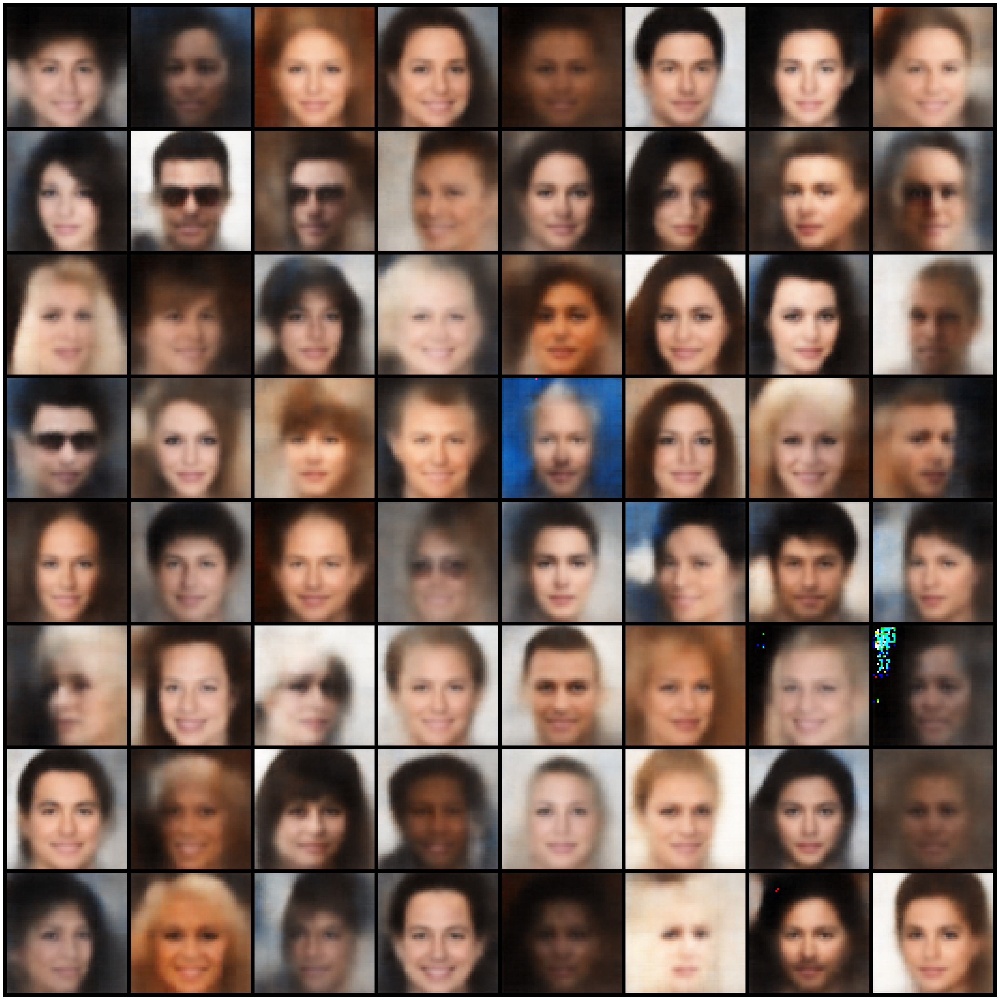

In [11]:
test_input, _ = next(iter(test_dl))
test_input = test_input.to(device)

model.eval()
with torch.no_grad():
    recons, _, _ = model(test_input)

grid = make_grid(recons)
show(grid)

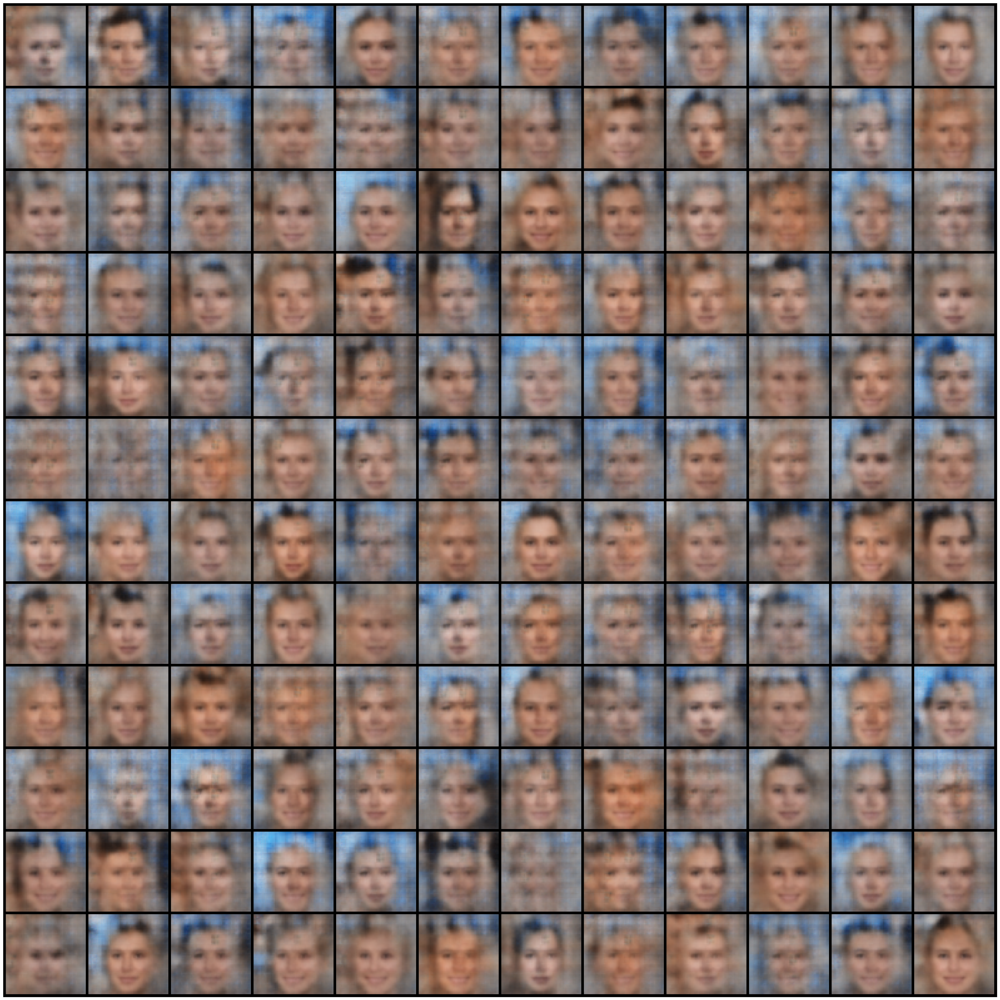

In [12]:
z = torch.randn(144, 128).to(device)

samples = model.decoder(z)

grid = make_grid(samples, nrow=12)
show(grid)

In [13]:
attrs = trainset.attr_names[:-1]
print(attrs)
print(f"#Attr: {len(attrs)}")

['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']
#Attr: 40


In [14]:
def interpolate(autoencoder, x_1, x_2, n=20, title=None):
    z_1 = autoencoder.get_latent(x_1)[0]
    z_2 = autoencoder.get_latent(x_2)[0]
    z = torch.stack([z_1 + (z_2 - z_1)*t for t in np.linspace(0, 1, n)])
    interpolate_list = autoencoder.decoder(z)
    interpolate_list = interpolate_list.permute(0, 2, 3, 1).to('cpu').detach().numpy()

    w = 64
    img = np.zeros((w, n*w, 3))
    for i, x_hat in enumerate(interpolate_list):
        img[:, i*w:(i+1)*w] = x_hat
    fig, ax = plt.subplots(figsize=(15, 2))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.title(title)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_542941/242201030.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(15, 2))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with R

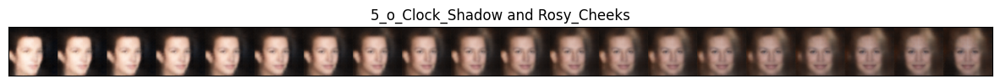

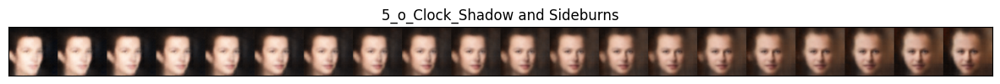

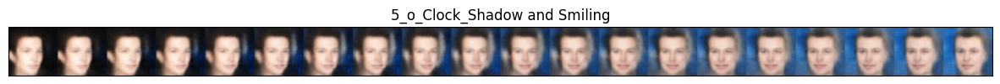

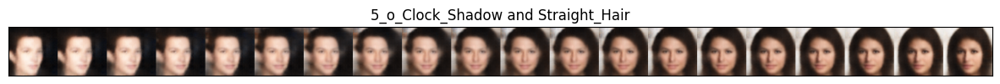

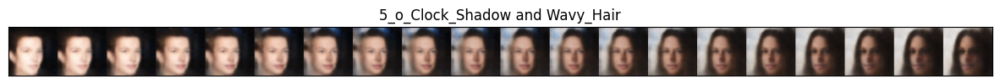

...

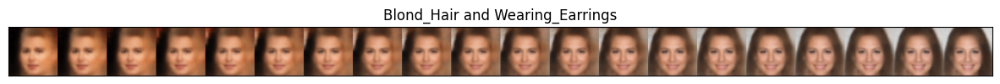

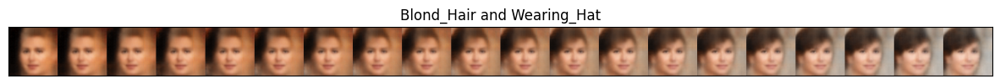

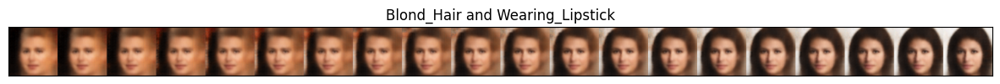

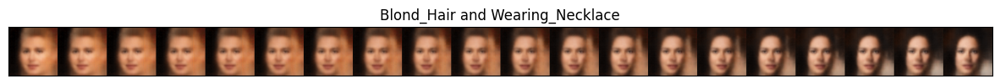

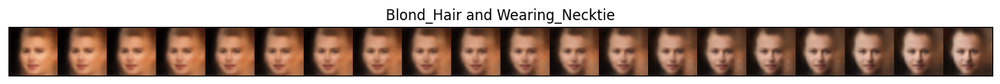

In [15]:
model.eval()
with torch.no_grad():
    x, y = next(iter(train_dl))
    for idx_x in range(10):
        for idx_y in range(29, 39):
            x_1 = x[y[:, idx_x] == 1][1].to(device).unsqueeze(0)
            x_2 = x[y[:, idx_y] == 1][1].to(device).unsqueeze(0)

            interpolate(model, x_1, x_2, n=20, title = f"{attrs[idx_x]} and {attrs[idx_y]}")

            # plt.close()